# Proyecto Final - Lab Inteligencia (Imágenes)

In [1]:
#Imports
import matplotlib.pyplot as plt
import numpy as np
import cv2
from scipy.spatial import distance as dist
import argparse
import glob

## I.- Calculo de vector de caracteristicas

### 1.a) Transformación a HSV

In [2]:
#Funcion que transforme del espacio RGB al HSV
def rgb2hsv (nombreImagen):
    #Lectura
    readImage = cv2.imread(nombreImagen)
    #Transformacion de espacio. Devuelve una matriz 3d
    imageHSV = cv2.cvtColor(readImage,cv2.COLOR_BGR2HSV)
    return imageHSV

### 1.b) División de la imagen (funciones)

#### 1.b.i) 3x3 Celdas.

In [3]:
#Funcion que recorte la imagen en 3x3 celdas. Devuelve 3 submatrices.
def div9Celdas(imHSV):
    #division
    H = imHSV[:,:,0]
    S = imHSV[:,:,1]
    V = imHSV[:,:,2]
    #Dimensiones de la imagen
    alto,ancho,prof = imHSV.shape
    #Nuevas dimensiones
    nuevoAlto = int(alto/3)
    nuevoAncho = int(ancho/3)
    #Creacion de las tres matrices (inicialmente vacias).
    Hdiv = np.zeros([nuevoAlto,nuevoAncho,9])
    Sdiv = np.zeros([nuevoAlto,nuevoAncho,9])
    Vdiv = np.zeros([nuevoAlto,nuevoAncho,9])
    #Dividir imagen
    vecDivisionesAlto = [0,nuevoAlto,nuevoAlto,nuevoAlto*2,nuevoAlto*2,nuevoAlto*3]
    vecDivisionesAncho = [0,nuevoAncho,nuevoAncho,nuevoAncho*2,nuevoAncho*2,nuevoAncho*3]
    count = 0
    count1 = 0
    while count1 <= 5:
        count2 = 0
        while count2 <= 5:
            Hdiv[:,:,count] = H[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            Sdiv[:,:,count] = S[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            Vdiv[:,:,count] = V[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            count += 1
            count2 += 2
        count1 +=2  
        
    return np.uint8(Hdiv),np.uint8(Sdiv),np.uint8(Vdiv)

#### 1.b.ii) 4x4 Celdas

In [4]:
#Funcion que recorte la imagen en 4x4 celdas. Devuelve 16 submatrices.
def div16Celdas(imHSV):
    H = imHSV[:,:,0]
    S = imHSV[:,:,1]
    V = imHSV[:,:,2]
    #Dimensiones de la imagen
    alto,ancho,prof = imHSV.shape
    #Nuevas dimensiones
    nuevoAlto = int(alto/4)
    nuevoAncho = int(ancho/4)
    #Creacion de las tres matrices (inicialmente vacias).
    Hdiv = np.zeros([nuevoAlto,nuevoAncho,16])
    Sdiv = np.zeros([nuevoAlto,nuevoAncho,16])
    Vdiv = np.zeros([nuevoAlto,nuevoAncho,16])
    #Dividir imagen
    vecDivisionesAlto = [0,nuevoAlto,nuevoAlto,nuevoAlto*2,nuevoAlto*2,nuevoAlto*3,nuevoAlto*3,nuevoAlto*4]
    vecDivisionesAncho = [0,nuevoAncho,nuevoAncho,nuevoAncho*2,nuevoAncho*2,nuevoAncho*3,nuevoAncho*3,nuevoAncho*4]
    count = 0
    count1 = 0
    while count1 <= 7:
        count2 = 0
        while count2 <= 7:
            Hdiv[:,:,count] = H[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            Sdiv[:,:,count] = S[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            Vdiv[:,:,count] = V[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            count += 1
            count2 += 2
        count1 +=2  
        
    return np.uint8(Hdiv),np.uint8(Sdiv),np.uint8(Vdiv)

#### 1.b.iii) 6x6 celdas

In [5]:
#Funcion que recorte la imagen en 6x6 celdas. Devuelve 3 submatrices.
def div36Celdas(imHSV):
    H = imHSV[:,:,0]
    S = imHSV[:,:,1]
    V = imHSV[:,:,2]
    #Dimensiones de la imagen
    alto,ancho,prof = imHSV.shape
    #Nuevas dimensiones
    nuevoAlto = int(alto/6)
    nuevoAncho = int(ancho/6)
    #Creacion de las tres matrices (inicialmente vacias).
    Hdiv = np.zeros([nuevoAlto,nuevoAncho,36])
    Sdiv = np.zeros([nuevoAlto,nuevoAncho,36])
    Vdiv = np.zeros([nuevoAlto,nuevoAncho,36])
    #Dividir imagen
    vecDivisionesAlto = [0,nuevoAlto,nuevoAlto,nuevoAlto*2,nuevoAlto*2,nuevoAlto*3,nuevoAlto*3,nuevoAlto*4,nuevoAlto*4,nuevoAlto*5,nuevoAlto*5,nuevoAlto*6]
    vecDivisionesAncho = [0,nuevoAncho,nuevoAncho,nuevoAncho*2,nuevoAncho*2,nuevoAncho*3,nuevoAncho*3,nuevoAncho*4,nuevoAncho*4,nuevoAncho*5,nuevoAncho*5,nuevoAncho*6]
    count = 0
    count1 = 0
    while count1 <= 11:
        count2 = 0
        while count2 <= 11:
            a = H[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            Hdiv[:,:,count] = a
            Sdiv[:,:,count] = S[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            Vdiv[:,:,count] = V[vecDivisionesAlto[count1]:vecDivisionesAlto[count1+1],vecDivisionesAncho[count2]:vecDivisionesAncho[count2+1]]
            count += 1
            count2 += 2
        count1 +=2  
        
    return np.uint8(Hdiv),np.uint8(Sdiv),np.uint8(Vdiv)

#### 1.b.iiii) División en formas irregulares.

In [6]:
#Funcion que devuelva los pedazos media luna.
def cuatroSectores (imHSV):
    #Dimensiones de la imagen
    alto,ancho,prof = imHSV.shape
    #centro (aprox)
    centroH = int(alto/2)
    centroW = int(ancho/2)   
    #Dibujar elipse.
    imHSVPost = cv2.ellipse(imHSV, (centroH,centroW), (int(alto/3),int(ancho/4)), 0, 0, 360, 0, thickness=-1)
    #division
    H = imHSVPost[:,:,0]
    S = imHSVPost[:,:,1]
    V = imHSVPost[:,:,2]
    #Corte de las cuatro secciones.
    H1 = H[0:centroH,0:centroW] 
    S1 = S[0:centroH,0:centroW]
    V1 = V[0:centroH,0:centroW]
    H2 = H[0:centroH,centroW-1:ancho] 
    S2 = S[0:centroH,centroW-1:ancho]
    V2 = V[0:centroH,centroW-1:ancho]
    H3 = H[centroH-1:alto,0:centroW] 
    S3 = S[centroH-1:alto,0:centroW]
    V3 = V[centroH-1:alto,0:centroW]
    H4 = H[centroH-1:alto,centroW-1:ancho] 
    S4 = S[centroH-1:alto,centroW-1:ancho]
    V4 = V[centroH-1:alto,centroW-1:ancho]
    return H1,S1,V1,H2,S2,V2,H3,S3,V3,H4,S4,V4,alto,ancho

#Funcion que devuelva elipse central
def elipseCentral(imHSV):
    #Dimensiones de la imagen
    alto,ancho,prof = imHSV.shape
    #centro (aprox)
    centroH = int(alto/2)
    centroW = int(ancho/2)   
    #Dibujar elipse.
    #Mascara de color negro
    mask = np.zeros_like(imHSV)
    #Crear ellipse blanco (valores maximos)
    mask = cv2.ellipse(mask,(centroH, centroW), (int(alto/3),int(ancho/4)), angle=0, startAngle=0, endAngle=360, color=255, thickness=-1)
    #AND logico entre imagen y mascara
    imagen5 = np.bitwise_and(imHSV,mask)
    H = imagen5[:,:,0]
    S = imagen5[:,:,1]
    V = imagen5[:,:,2]
    return H,S,V,mask[:,:,0]

### 1.c) y d) Cálculo de histogramas, normalización y concatenación.

In [7]:
#Funcion que realice la normalización de histogramas
def normHist(colIm,filIm,histogram):
    sumaHist = np.sum(histogram)
    normHist = (1/sumaHist)*histogram
    normHist = np.ravel(normHist)
    return normHist

#Funcion que calcule el histograma y lo normalice con la funcion anterior.
def histogramaNormalizado(mat,nBins,fils,cols,mask=np.array([0,0,0])):
    #Calculo del histograma
    if mask.all() == 0:
        hist = cv2.calcHist([mat],[0],None,[nBins],[0,256])
    else:
        hist = cv2.calcHist([mat],[0],mask,[nBins],[0,256])
    #Normalizacion
    nH = normHist(cols,fils,hist)
    return nH

#### 1.cd.i) Histogramas Divisiones retagulares

In [8]:
#Funcion que realice el calculo y normalización de una imagen
def histRects(imagen,nDivisiones):
    #Dimensiones de la imagen
    [filas,cols,prof] = imagen.shape
    #Obtencion de las divisiones.
    if (nDivisiones==9):
        Hdiv,Sdiv,Vdiv = div9Celdas(imagen)
    elif (nDivisiones==16):
        Hdiv,Sdiv,Vdiv = div16Celdas(imagen)        
    elif (nDivisiones==36):
        Hdiv,Sdiv,Vdiv = div36Celdas(imagen)
    #Arreglos de histogramas.
    histH = np.zeros(8*nDivisiones)
    histS = np.zeros(12*nDivisiones)
    histV = np.zeros(3*nDivisiones)
    #Calculo y concatenación de los histogramas
    count = 0
    while count<nDivisiones:
        #Calculo de los histogramas y concatenacion
        hH = histogramaNormalizado(Hdiv[:,:,count],8,filas,cols)
        hS = histogramaNormalizado(Sdiv[:,:,count],12,filas,cols)
        hV = histogramaNormalizado(Vdiv[:,:,count],3,filas,cols)
        #Concatenar
        histH[count*8:count*8+8] = hH
        histS[count*12:count*12+12] = hS
        histV[count*3:count*3+3] = hV
        count +=1
    return np.concatenate((hH,hS,hV))

#### 1.cd.ii) Histogramas divisiones no rectangulares.

In [9]:
#Funcion que calcule el histograma para la sección elipzoidal
#Utiliza máscara.
def histRedondo(imHSV):
    filIm,colIm,prof = imHSV.shape
    H,S,V,mask = elipseCentral(imHSV)
    #Histogramas
    hH = cv2.calcHist([H],[0],mask,[8],[0,256])
    hS = cv2.calcHist([S],[0],mask,[12],[0,256])
    hV = cv2.calcHist([V],[0],mask,[3],[0,256])
    #Normalización
    hH = normHist(colIm,filIm,hH)
    hS = normHist(colIm,filIm,hS)
    hV = normHist(colIm,filIm,hV)
    return hH,hS,hV

def defMask(mat,sector,fils,cols):
    #Mascara blanca
    mask = 255*np.ones_like(mat)
    #Dimensiones de la matriz
    hMat,wMat = mat.shape
    #Dimensiones elipse
    altoE,anchoE = (int(fils/3),int(cols/4))
    if(sector==1):
        mask = cv2.ellipse(mask,(hMat-1,wMat-1), (altoE,anchoE), 0, 180, 270, 0, thickness=-1) 
    elif(sector==2):
        mask = cv2.ellipse(mask,(hMat-1,0), (altoE,anchoE), 0, 270, 360, 0, thickness=-1)
    elif(sector==3):
        mask = cv2.ellipse(mask,(0,0), (altoE,anchoE), 0, 0, 90, 0, thickness=-1)    
    elif(sector==4):
        mask = cv2.ellipse(mask,(0,wMat-1), (altoE,anchoE), 0, 90, 180, 0, thickness=-1)
    return mask

def histOtrosRedondo(imHSV):
    #Cortes
    H1,S1,V1,H2,S2,V2,H3,S3,V3,H4,S4,V4,fils,cols = cuatroSectores(imHSV)
    #Máscaras
    mask1=defMask(H1,1,fils,cols)
    mask2=defMask(H2,2,fils,cols)
    mask3=defMask(H3,3,fils,cols)
    mask4=defMask(H4,4,fils,cols)
    #Histogramas normalizados
    H1Norm = histogramaNormalizado(H1,8,fils,cols,mask1)
    H2Norm = histogramaNormalizado(H2,8,fils,cols,mask2)
    H3Norm = histogramaNormalizado(H3,8,fils,cols,mask3)
    H4Norm = histogramaNormalizado(H4,8,fils,cols,mask4)
    S1Norm = histogramaNormalizado(S1,12,fils,cols,mask1)
    S2Norm = histogramaNormalizado(S2,12,fils,cols,mask2)
    S3Norm = histogramaNormalizado(S3,12,fils,cols,mask3)
    S4Norm = histogramaNormalizado(S4,12,fils,cols,mask4)
    V1Norm = histogramaNormalizado(V1,3,fils,cols,mask1)
    V2Norm = histogramaNormalizado(V2,3,fils,cols,mask2)
    V3Norm = histogramaNormalizado(V3,3,fils,cols,mask3)
    V4Norm = histogramaNormalizado(V4,3,fils,cols,mask4)
    #Concatenar
    hH = np.zeros(8*4)
    hS = np.zeros(12*4)
    hV = np.zeros(3*4)
    count = 0
    hH[0:8]=H1Norm;hH[8:16]=H2Norm;hH[16:24]=H3Norm;hH[24:32]=H4Norm
    hS[0:12]=S1Norm;hS[12:24]=S2Norm;hS[24:36]=S3Norm;hS[36:48]=S4Norm
    hV[0:3]=V1Norm;hV[3:6]=V2Norm;hV[6:9]=V3Norm;hV[9:12]=V4Norm
    return hH,hS,hV  

def histNoCuadrado(imHSV):
    #Histogramas sectores
    hH1,hS1,hV1 = histRedondo(imHSV)
    hH2,hS2,hV2 = histOtrosRedondo(imHSV)
    #Concatenacion
    hH = np.zeros(8*5)
    hS = np.zeros(12*5)
    hV = np.zeros(3*5)
    hH[0:8*4] = hH2; hH[8*4:8*5] = hH1;
    hS[0:12*4] = hS2; hS[12*4:12*5] = hS1;
    hV[0:3*4] = hV2; hV[3*4:3*5] = hV1;
    return np.concatenate((hH,hS,hV))
    

In [10]:
#Funcion que calcule con el nombre de la imagen.
def histSectores(nombreImagen,nDivisiones):
    #Transformacion a HSV
    imHSV = rgb2hsv(nombreImagen)
    if(nDivisiones==5):
        out = histNoCuadrado(imHSV)
    else:
        out = histRects(imHSV,nDivisiones)
    return np.ravel(out)

## II. Medidas de Similitud

### 2) Implementación de medidas de similitud

#### 2.1) Euclideana

In [11]:
def compareEuc(hist1,hist2):
    #Comparar.
    distancia = dist.euclidean(hist1, hist2,1)
    return distancia

## III. Orden de resultados por relevancia

#### 3) Esquemas de comparación

##### Incorporación de img_database y Cálculo de histogramas.

In [12]:
def extraerClase(stringClase):
    #Extraer la clase de la imagen
    clase = stringClase[1:4]
    claseNum = int(clase)
    return claseNum 

def incorporarDatabase():
    #Funcion que incorpore elementos del database, con el fin posterior de realizar las comparaciones.
    #Inicializa images para almacenar las imágenes
    images = {}
    #Recorrer el directorio
    #Directorio
    path = "img_database/*.jpg"
    #Loop.
    for imPath in glob.glob(path):
        #Nombre del archivo
        filename = imPath[imPath.rfind("\\")+1:]
        #Importar
        image = cv2.imread(imPath)
        #Almacenar en imagenes.
        images[filename] = image
    return images

def incorporarDatabaseHist(nDivisiones):
    #Funcion que calcule los histogramas del Database.
    # Inicializa el diccionario index, para almacenar el nombre de imagen con su histograma
    path = "img_database/*.jpg"
    #Creacion de arreglos
    nombres = np.array([])
    clases = np.array([])
    histos = np.array([])
    count = 0
    #Loop.
    for imPath in glob.glob(path):
        #Nombre del archivo
        filename = imPath[imPath.rfind("\\")+1:]
        #Agregar nombre y clase
        nombres = np.append(nombres,str(filename))
        clases = np.append(clases,extraerClase(filename))
        #Obtener el histograma
        histImagen = histSectores(imPath,nDivisiones)
        #Incluir histograma
        if (count==0):
            histos=histImagen.T
            count = 1
        elif(count==1):
            histos = np.concatenate(([histos],[histImagen.T]),axis=0)
            count = 2
        else:
            histos = np.concatenate((histos,np.array([histImagen])),axis=0)
    return nombres,clases,histos

In [13]:
nombres5,clases5,histos5 = incorporarDatabaseHist(5)

In [14]:
nombres9,clases9,histos9 = incorporarDatabaseHist(9)
nombres16,clases16,histos16 = incorporarDatabaseHist(16)
nombres36,clases36,histos36 = incorporarDatabaseHist(36)

##### Comparación de una imagen versus la base de datos.

In [15]:
def distanciaUnaImagen(nombreImagenQuery,divisiones):
    #Obtener histograma de la imagen query.
    histQuery = histSectores(nombreImagenQuery,divisiones)
    #Seleccion de la matriz de histogramas a comparar.
    if (divisiones==5):
        histComparar = histos5    
    elif (divisiones==9):
        histComparar = histos9
    elif (divisiones==16):
        histComparar = histos16
    elif (divisiones==36):
        histComparar = histos36
    #Comparaciones:
    comparaciones = np.array([])
    for h in histComparar:
        distancia = compareEuc(h,histQuery)
        comparaciones = np.append(comparaciones,distancia)
    return comparaciones

##### Comparación de todas las querys.

In [16]:
def compararQueries(nDivisiones):
    #Funcion que compare las queries para el numero de divisiones deseado.
    # Inicializa el diccionario index, para almacenar el nombre de imagen con su histograma
    path2 = "img_query/*.jpg"
    #Creación de arreglos
    nombres = np.array([])
    clases = np.array([])
    comparaciones = np.array([])
    #Loop.
    count = 0
    for imPath in glob.glob(path2):
        #Nombre del archivo
        posName = imPath.rfind("\\")
        filename2 = imPath[posName + 1:]
        #Calcular vector de comparaciones y la clase
        vecComparaciones = distanciaUnaImagen(imPath,nDivisiones)
        #Agregar nombre
        nombres = np.append(nombres,str(filename2))
        #Incluir clases
        clases = np.append(clases,extraerClase(filename2))
        #Incluir histograma
        if (count==0):
            comparaciones=vecComparaciones.T
            count = 1
        elif(count==1):
            comparaciones = np.concatenate(([comparaciones],[vecComparaciones.T]),axis=0)
            count = 2
        else:
            comparaciones = np.concatenate((comparaciones,[vecComparaciones]),axis=0)
    return nombres,clases,comparaciones

In [17]:
nombresQ5,clasesQ5,compQ5 = compararQueries(5)
nombresQ9,clasesQ9,compQ9 = compararQueries(9)
nombresQ16,clasesQ16,compQ16 = compararQueries(16)
nombresQ36,clasesQ36,compQ36 = compararQueries(36)

In [151]:
len(compQ5[0,:])

407

#### 4) Cálculo de Rank

In [19]:
def ordenarVector(vectorComparaciones,vecClases,vecNombres):
    #Funcion que ordene un vector de comparaciones de acuerdo a la distancia. Adicionalmente debe ordenar las clases asociadas
    #y los nombres de las figuras.
    orden = np.argsort(vectorComparaciones)
    #Ordenar
    #Comparaciones
    comparacionesOrdenado =np.sort(vectorComparaciones)
    #Ordenar clases y nombres
    clasesOrdenado = np.zeros_like(vecClases)
    nombresOrdenado = np.zeros_like(vecNombres)
    count = 0
    for i in orden:
        clasesOrdenado[count] = vecClases[i]
        nombresOrdenado[count] = vecNombres[i]
        count += 1
    return comparacionesOrdenado,clasesOrdenado,nombresOrdenado    

def rankIndividual(claseQuery,vectorComparaciones,vecNombresData,nDivisiones):
    #Funcion que calcule el rank para una consulta en particular.
    #Se usa clases 5, en realidad todas son iguales.
    Nrel = np.count_nonzero(clases5 == claseQuery)
    #Ordenar
    comparacionesOrdenado,clasesOrdenado,nombresOrdenado = ordenarVector(vectorComparaciones,clases5,vecNombresData)
    #Obtención de indices Ri
    Ri = np.ravel(np.argwhere(clasesOrdenado==claseQuery))
    #Calculo del Rank
    rank = np.sum(Ri)/Nrel
    return rank,nombresOrdenado
    
def rankQuery(vecClasesQuery,matComparacionesQuery,vecNombresData,nDivisiones):
    #Funcion que calcule el rank promedio de todas las query.
    count = 0
    rankTot = np.array([])
    for vecComparacionesQuery in matComparacionesQuery:
        rank,nameOrdenado = rankIndividual(vecClasesQuery[count],vecComparacionesQuery,vecNombresData,nDivisiones)
        rankTot = np.append(rankTot,rank)
        count += 1
    rankPromedio = np.mean(rankTot)
    return rankPromedio

In [20]:
promRank5 = rankQuery(clasesQ5,compQ5,nombres5,5)
promRank9 = rankQuery(clasesQ9,compQ9,nombres9,9)
promRank16 = rankQuery(clasesQ16,compQ16,nombres16,16)
promRank36 = rankQuery(clasesQ36,compQ36,nombres36,36)

print(promRank5)
print(promRank9)
print(promRank16)
print(promRank36)

34.32242592592593
56.18124867724868
67.31447354497355
77.15461904761904


#### 5) Rank Normalizado

In [21]:
#Funcion que calcule el Rank Normalizado para las figuras.
def rankNormalizadoIndividual(claseQuery,vectorComparaciones,vecNombresData,nDivisiones):
    #Numero total de elementos en el conjunto.
    N = len(nombres5)    #Elementos del conjunto de la misma clase que el elemnto de la Query.
    Nrel = np.count_nonzero(clases5 == claseQuery)
    #Ordenar comparaciones y datos. Ordenamiento de acuerdo al valor del vector de comparaciones.
    comparacionesOrdenado,clasesOrdenado,nombresOrdenado = ordenarVector(vectorComparaciones,clases5,vecNombresData)
    #Calculo del rank normalizado.
    factor1 = 1/(N*Nrel)
    factor2 = (Nrel*(Nrel+1))/(2)
    sumaR = np.sum(np.ravel(np.argwhere(clasesOrdenado==claseQuery)))
    rankNorm = factor1 * (sumaR - factor2)
    return rankNorm,nombresOrdenado

In [22]:
#Funcion que calcule el rank normalizado promedio de todas las figuras query.
def rankNormalizadoQuery(vecClasesQuery,matComparacionesQuery,vecNombresData,nDivisiones):
    #Funcion que calcule el rank promedio de todas las query.
    count = 0
    rankTot = 0
    for vecComparacionesQuery in matComparacionesQuery:
        rank,nameOrdenado = rankNormalizadoIndividual(vecClasesQuery[count],vecComparacionesQuery,vecNombresData,nDivisiones)
        rankTot = np.append(rankTot,rank)
        count += 1
    rankPromedio = np.mean(rankTot)
    return rankPromedio

In [23]:
promRankNormalizado5 = rankNormalizadoQuery(clasesQ5,compQ5,nombres5,5)
promRankNormalizado9 = rankNormalizadoQuery(clases9,compQ9,nombres9,9)
promRankNormalizado16 = rankNormalizadoQuery(clases16,compQ16,nombres16,16)
promRankNormalizado36 = rankNormalizadoQuery(clases36,compQ36,nombres36,36)

In [24]:
print(promRankNormalizado5)
print(promRankNormalizado9)
print(promRankNormalizado16)
print(promRankNormalizado36)

0.07924018238587775
0.4559358575914867
0.4532841842444491
0.4476131007587961


#### 6) Extracción de resultados cualitativos

In [103]:
#Funcion que entregue las diez mejores imagenes
def parte6(numeroImagen,nDivisiones):    
    if(nDivisiones==5):
        comparaciones = compQ5[numeroImagen,:]
    elif(nDivisiones==9):
        comparaciones = compQ9[numeroImagen,:]
    elif(nDivisiones==16):
        comparaciones = compQ16[numeroImagen,:]
    elif(nDivisiones==36):
        comparaciones = compQ36[numeroImagen,:]
    #Ordenar
    comparacionesOrdenado,clasesOrdenado,nombresOrdenado = ordenarVector(comparaciones,clases5,nombres5)
    print('Imagen Query:', nombresQ5[numeroImagen])
    mejores = nombresOrdenado[0:10]
    print('Mejores 10 imagenes:', mejores)
    # Imprimir Query
    imQ = cv2.imread("img_query\\"+nombresQ5[numeroImagen])
    imQ = cv2.resize(imQ,None,fx=.2, fy=.2, interpolation = cv2.INTER_CUBIC)
    cv2.imshow("imagenQuery",imQ)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    # loop over the results
    for im in mejores:
        # load the result image and display it
        result = cv2.imread("img_database\\" + im)
        result = cv2.resize(result,None,fx=.2, fy=.2, interpolation = cv2.INTER_CUBIC)
        cv2.imshow(im, result)
        cv2.waitKey(0)
    cv2.destroyAllWindows()

In [138]:
#Funcion que entregue las diez mejores imagenes
def parte6Pro(numeroImagen,nDivisiones):    
    if(nDivisiones==5):
        comparaciones = compQ5[numeroImagen,:]
    elif(nDivisiones==9):
        comparaciones = compQ9[numeroImagen,:]
    elif(nDivisiones==16):
        comparaciones = compQ16[numeroImagen,:]
    elif(nDivisiones==36):
        comparaciones = compQ36[numeroImagen,:]
    #Ordenar
    comparacionesOrdenado,clasesOrdenado,nombresOrdenado = ordenarVector(comparaciones,clases5,nombres5)
    mejores = nombresOrdenado[0:10]
    nameQuery = nombresQ5[numeroImagen]
    claseQuery = clasesQ5[numeroImagen]
    #Definicion del grafico.
    fig=plt.figure(figsize=(20, 20))
    columns = 3
    rows = 5
    #Ploteo imagen query
    imQ = cv2.imread("img_query\\"+nombresQ5[numeroImagen])
    imQ = cv2.cvtColor(imQ,cv2.COLOR_BGR2RGB)
    fig.add_subplot(rows, columns, 2)
    plt.axis('off')
    plt.title("imagen Query. Clase: " + str(clasesQ5[numeroImagen]))
    plt.imshow(imQ, aspect='auto')
    #Ploteo otras imagenes.
    for i in range(0, 10):
        imgBGR = cv2.imread("img_database\\" + mejores[i])
        img = cv2.cvtColor(imgBGR,cv2.COLOR_BGR2RGB)
        fig.add_subplot(rows, columns, i+4)
        plt.axis('off')   
        if(str(claseQuery)==str(clasesOrdenado[i])):
             plt.title("Imagen Database de clase: " + str(clasesOrdenado[i]),color='g')
        else:
             plt.title("Imagen database de tipo: " + str(clasesOrdenado[i]),color='r')
        plt.imshow(img, aspect='auto')
        
    plt.savefig('comparacionImagen' + str(numeroImagen) + 'div' + str(nDivisiones) +  '.jpg')

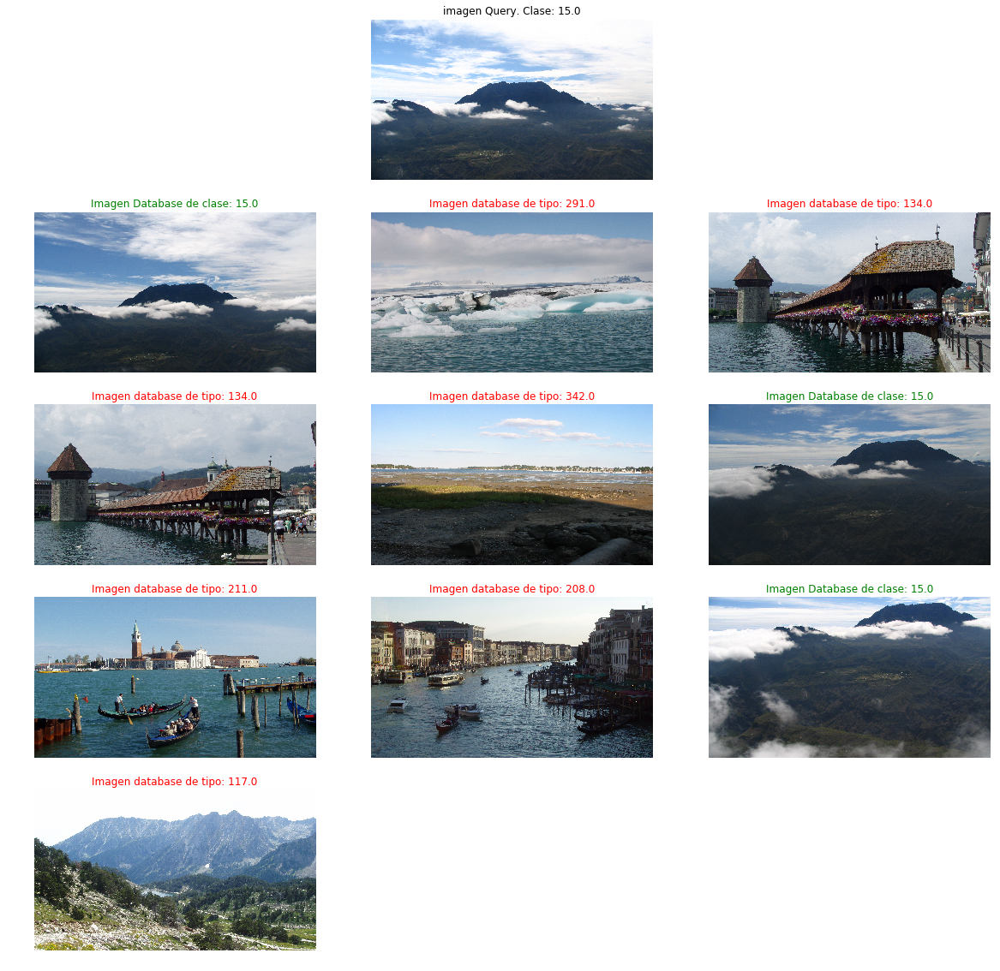

In [143]:
parte6Pro(1,5)

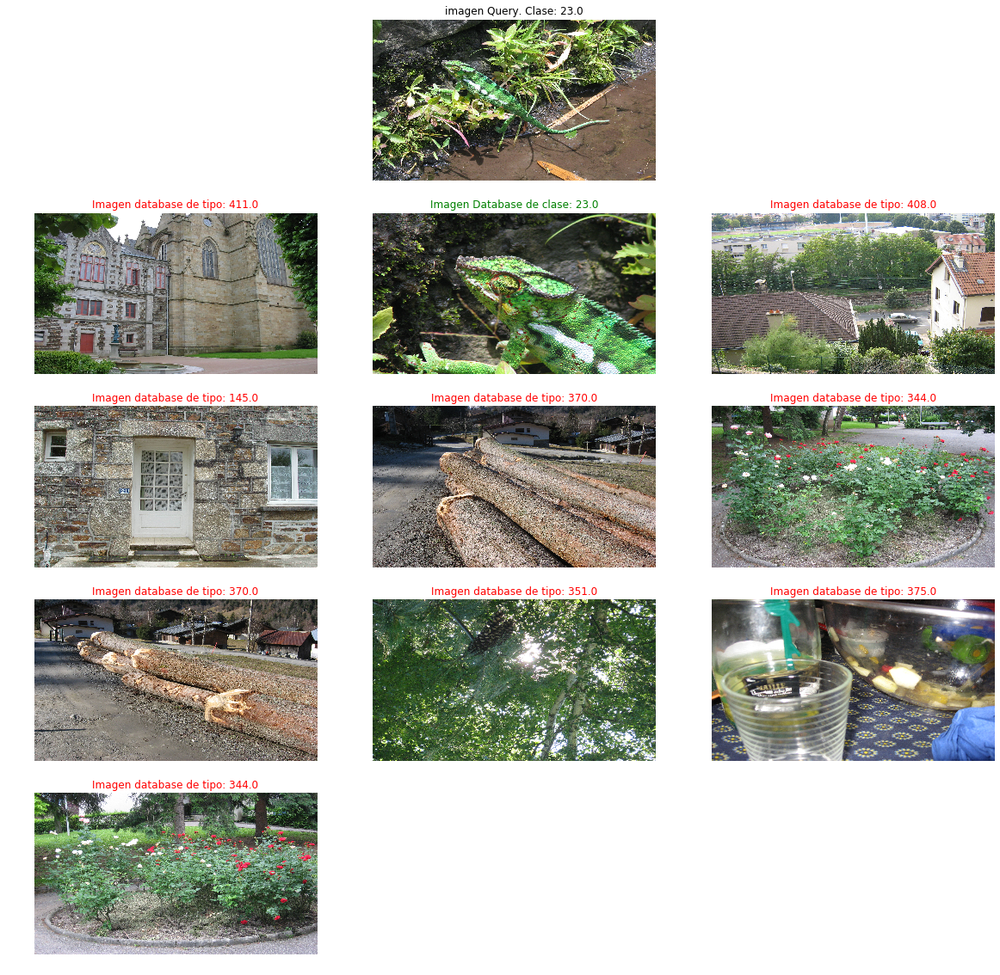

In [144]:
parte6Pro(2,5)

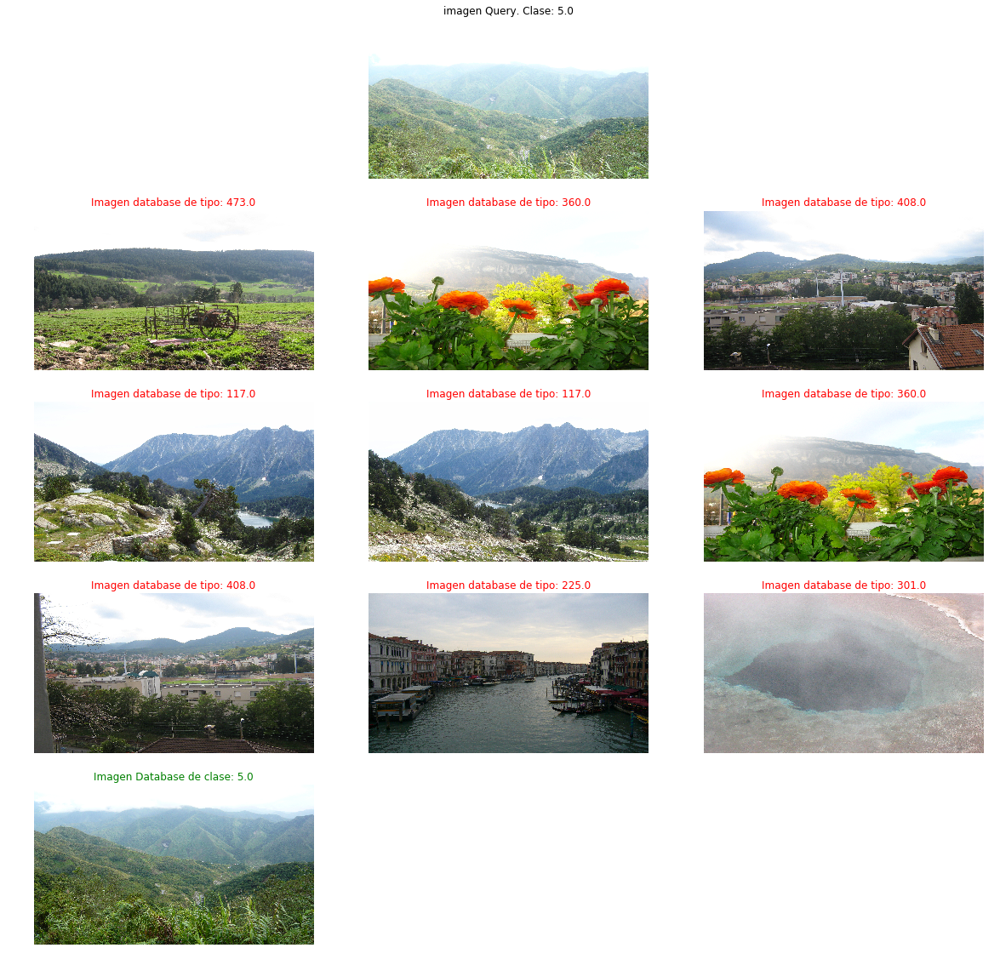

In [145]:
parte6Pro(0,5)

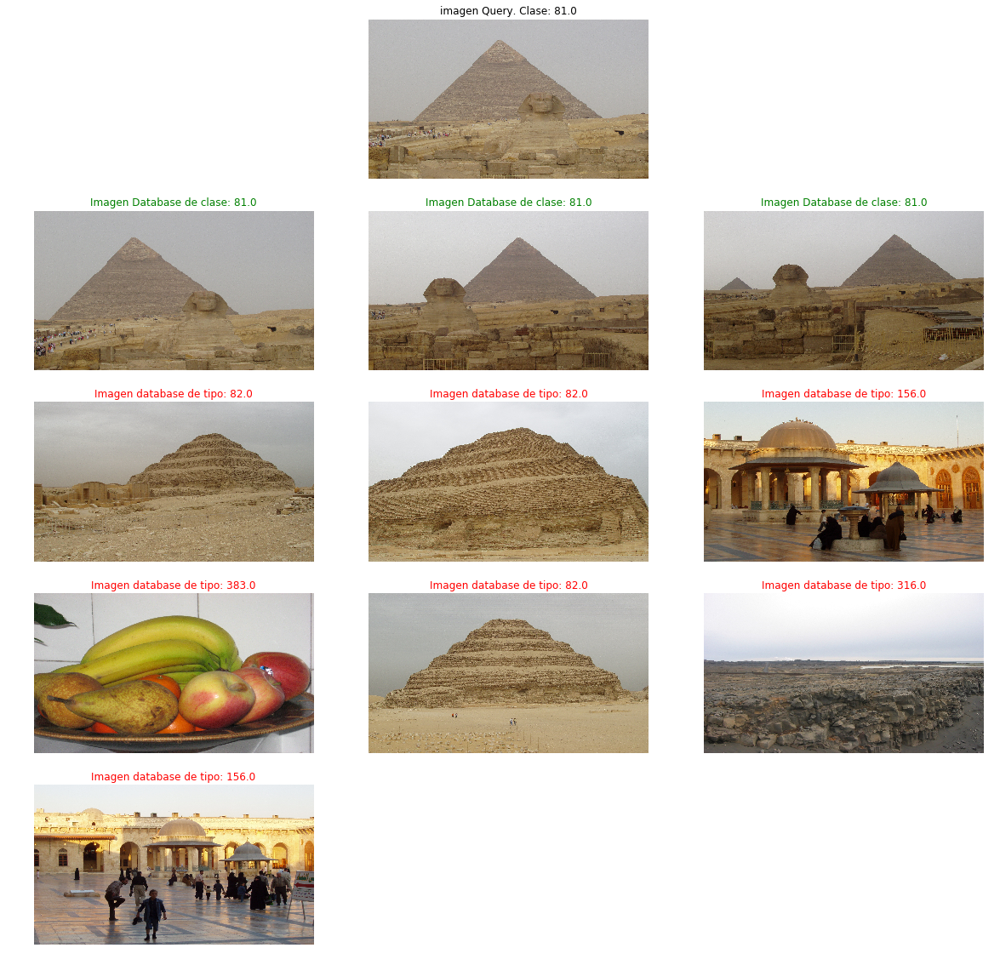

In [147]:
parte6Pro(10,5)

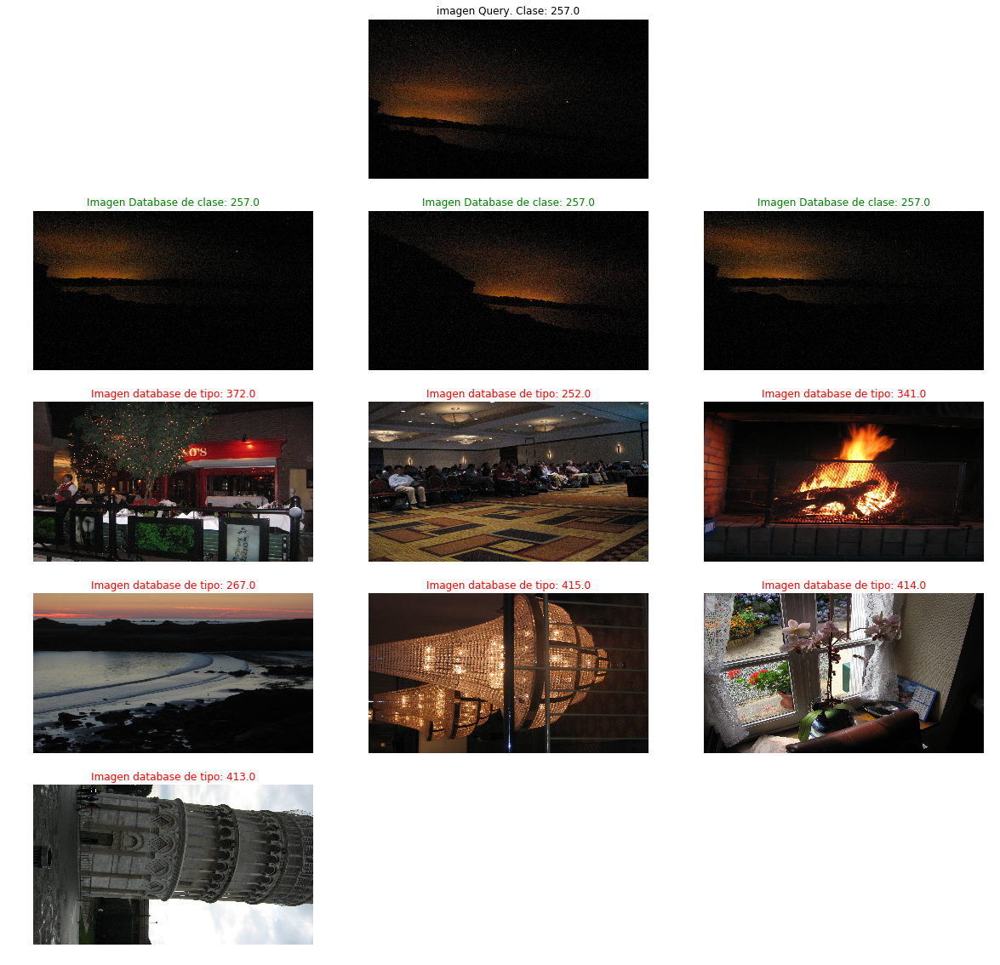

In [148]:
parte6Pro(52,5)

In [153]:
#Guardar datos.
np.save('nombres5',nombres5)
np.save('clases5',clases5)
np.save('histos5',histos5)
np.save('nombresQ5',nombresQ5)
np.save('clasesQ5',clasesQ5)
np.save('compQ5',compQ5)